In [1]:
pip install basemap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 864.1/864.1 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 11.6 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1


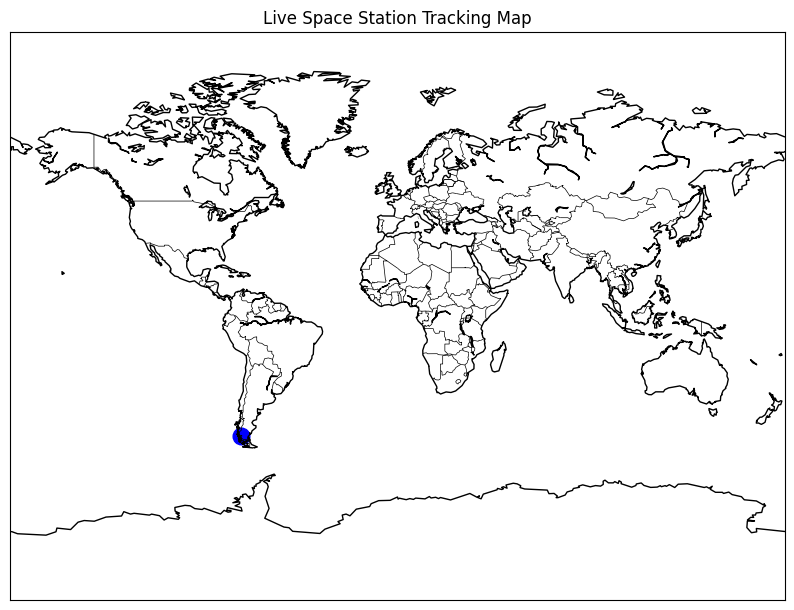

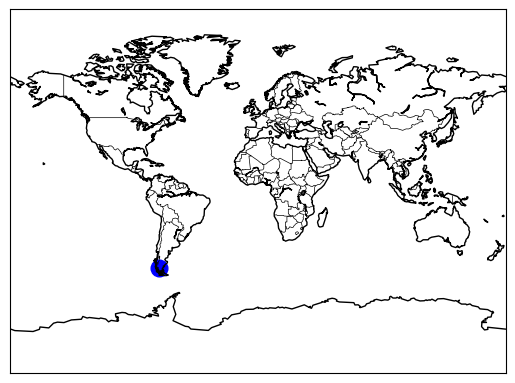

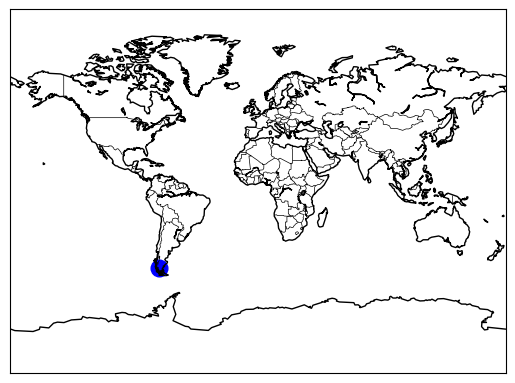

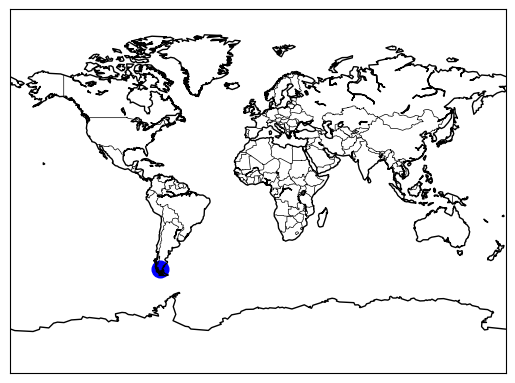

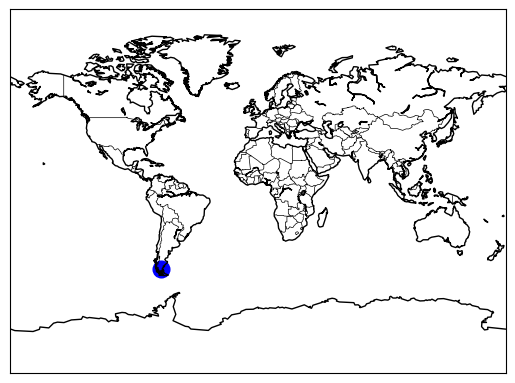

...

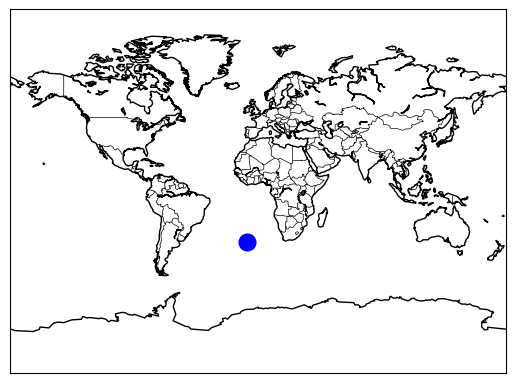

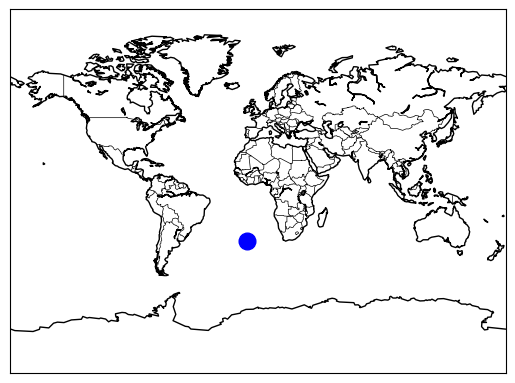

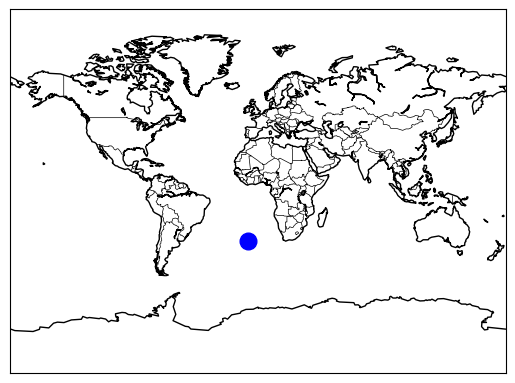

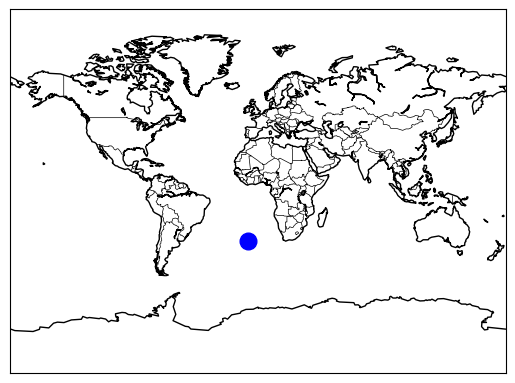

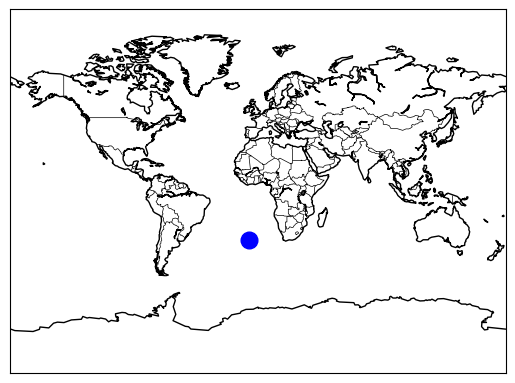

<Figure size 640x480 with 0 Axes>

In [4]:
import requests
import json
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import time

# Set up the figure
fig = plt.figure(figsize=(10, 10))

# Set up the map projection
m = Basemap(projection='mill', lon_0=0)

# Set up the plot title
plt.title('Live Space Station Tracking Map')

# Set the URL for the API
url = 'http://api.open-notify.org/iss-now.json'

# Set the start time for the data streaming
start_time = time.time()

# Stream data for one hour
while time.time() - start_time < 3600:
    # Fetch data from the API
    response = requests.get(url).json()

    # Get the longitude of the ISS
    long = float(response['iss_position']['longitude'])
     # Get the latitude of the ISS 
    lat = float(response['iss_position']['latitude'])

    # Clear the previous plot and plot the new location
    # plt.clf()
    x, y = m(long, lat)
    m.plot(x, y, 'bo', markersize=12)

    # Draw the coastlines and the countries
    m.drawcoastlines()
    m.drawcountries()

    # Update the plot and wait for 5 seconds before fetching the next data
    plt.pause(0.001)
    time.sleep(5)

# Save the plot as an image file
plt.savefig('iss_location.png')